In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

filepath = "~/Documents/03 Resources/research/petrolina/EQUIDOSO_Study_IMPUTED_Dataset_2020-06-30.xlsx"
df = pd.read_excel(filepath, index_col=0)
df.loc[df['GRUPO'] == 'GC', 'Label'] = int(1)
df.loc[df['GRUPO'] == 'GE', 'Label'] = int(0)
df['Label'] = df['Label'].astype('int64')

data = df.drop(labels=['GRUPO', 'SEXO', 'Label'], axis=1).values

In [2]:
import seaborn as sns

# small_df = df[['Label', 'Gait_Speed_TS_T0', 'Gait_Speed_TS_T3', 'Gait_Speed_TS_T6']]
small_df = df.drop(labels=['GRUPO', 'SEXO'], axis=1)

In [3]:
small_df.head()

,IDADE,MASSA,ESTATURA,IMC,Gait_Speed_TS_T0,Gait_Speed_TS_T3,Gait_Speed_TS_T6,Gait_Speed_TS_T9,Gait_Speed_TS_T12,Gait_Variability_TS_T0,...,StroopColor_ortost_T3,StroopColor_ortost_T6,StroopColor_ortost_T9,StroopColor_ortost_T12,StroopColorEffectOrt_T0,StroopColorEffectOrt_T3,StroopColorEffectOrt_T6,StroopColorEffectOrt_T9,StroopColorEffectOrt_T12,Label
ID,,,,,,,,,,,,,,,,,,,,,
s01,69,56.4,1.51,24.74,1.11,1.08,1.10,1.15,1.41,2.85,...,102.0,98.4,64.12,96.00,-116.18,-165.63,-158.95,-94.59,-137.62,1
s02,60,63.0,1.64,23.42,1.41,1.34,1.43,1.40,1.31,2.57,...,45.5,43.5,44.95,44.30,-66.47,-94.44,-80.50,-90.87,-93.45,1
s03,70,62.9,1.59,24.88,1.40,1.43,1.38,1.50,1.44,1.90,...,88.0,57.0,93.70,60.90,-189.85,-172.45,-96.55,-185.67,-110.00,0
s04,64,81.0,1.58,32.45,1.34,1.24,1.37,1.36,1.46,2.43,...,121.7,52.2,43.30,58.80,-127.88,-307.02,-66.77,-90.75,-117.78,1
s05,65,37.4,1.48,17.07,1.61,1.26,1.26,1.41,1.27,2.28,...,64.8,57.5,60.40,66.05,-110.36,-131.43,-135.66,-61.93,-104.11,0


In [14]:
# Plot pairwise relationships in a dataset.
sns.pairplot(small_df, hue="Label", palette="husl")

KeyboardInterrupt: 

ValueError: Image size of 70020x70020 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 70020x70020 with 1769 Axes>

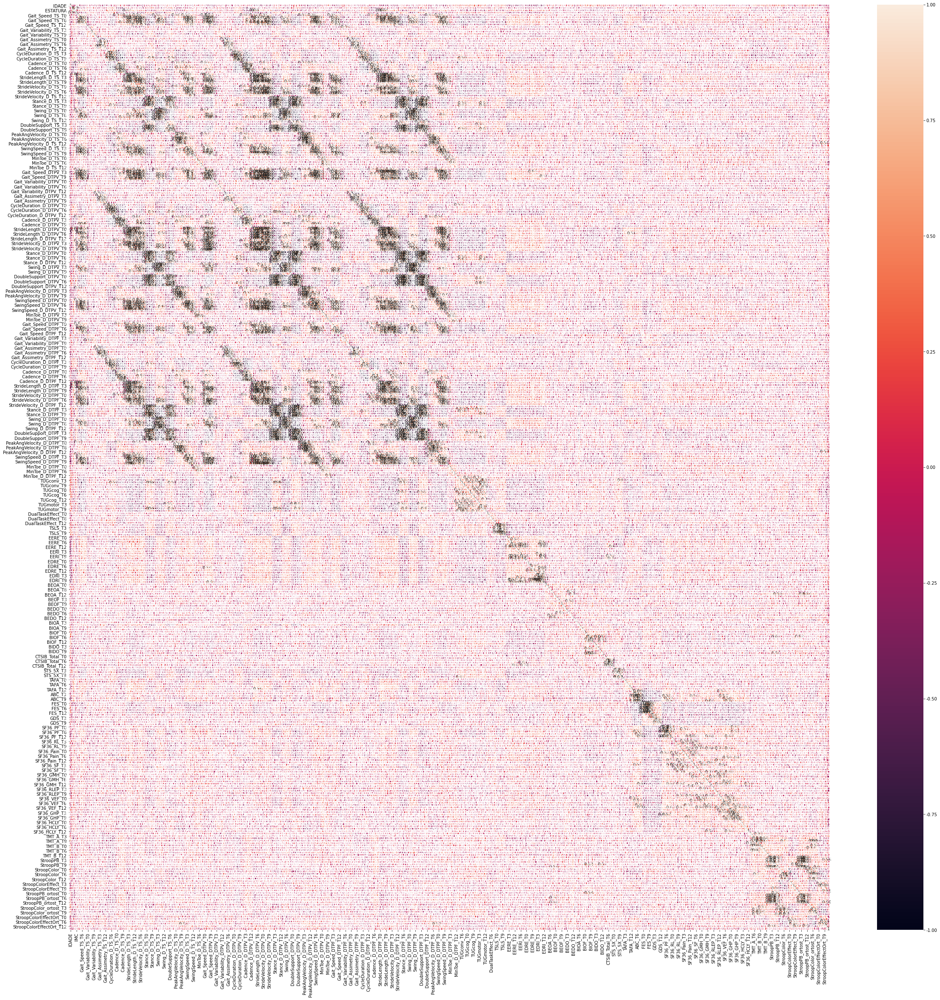

In [20]:
plt.subplots(figsize=(40,40))
sns.heatmap(small_df.corr(), annot=True)

# Grey Relational Analysis
- Determine the correlation among different factors or to build classification/prediction model
- Grey colour indicates the amount of known information in the prediction mechanism.

### Grey relational coefficient (GRC) and grey relational grade (GRG) 
- Similar to correlation coefficient
- Measure the absolute distance between reference projects and comparative projects via GRA
- Defined by Deng [1]
- The larger the grey relational coefficient, the closer xij and x0j are. 

----
- [1] Deng, J.L.: Controls problems on grey system. Syst. Control Lett. 1(5), 288–294 (1982)
- Yiyo Kuo; Taho Yang; Guan-Wei.: Huang The use of a grey-based Taguchi method for optimizing multi-response simulation problems
- https://programmer.group/5e4b66268a670.html

In [4]:
from sklearn.preprocessing import StandardScaler
import pandas as pd
import numpy as np


class GreyRelationalCoefficient():
    
    def __init__(self, data, tetha=0.5, standard=True):
        '''
        data: Input matrix, vertical axis is attribute name, first column is parent sequence
        theta: Resolution coefficient, range 0~1，Generally take 0.5，The smaller the correlation coefficient is, the greater the difference is, and the stronger the discrimination ability is
        standard: Need standardization
        '''
        self.data = np.array(data)
        self.tetha = tetha
        self.standard = standard

    def get_calculate_relational_coefficient(self, parent_column=0):
        self.normalize()
        return self._calculate_relational_coefficient(parent_column)
        
    def normalize(self):
        if not self.standard:
            return None
        
        self.scaler = StandardScaler().fit(self.data) 
        self.data = self.scaler.transform(self.data)
        
    def _calculate_relational_coefficient(self, parent_column):
        # The first column is the parent column, and the absolute difference with other columns is obtained
        momCol = self.data[:,parent_column].copy()
        sonCol = self.data[:,0:]

        for col in range(sonCol.shape[1]):           
            sonCol[:,col] = abs(sonCol[:,col]-momCol)

        # Finding the minimum and maximum difference of two levels
        minMin = np.nanmin(sonCol)
        maxMax = np.nanmax(sonCol)

        # Calculation of correlation coefficient matrix
        cors = (minMin + (self.tetha * maxMax))/(sonCol + (self.tetha * maxMax))
        return cors
    
    @classmethod
    def absolute_degree_of_grey(cls, x0, x1):
        s0 = np.trapz(x0)
        s1 = np.trapz(x1)
        s0_s1 = np.trapz(x0 - x1)
        absolute_degreed = (1 + abs(s0) + abs(s1)) / (1 + abs(s0) + abs(s1) + abs(s0_s1))
        return absolute_degreed

In [5]:
K = len(small_df.columns)
correl = []
for i in range(K):
    model = GreyRelationalCoefficient(small_df, standard=True)
    cors = model.get_calculate_relational_coefficient(parent_column=i)
    mean_cors = cors.mean(axis=0)
    correl.append(mean_cors)

# sns.heatmap(correl, annot=True, xticklabels=small_df.columns, yticklabels=small_df.columns, vmin=0, vmax=1) # cmap="YlGnBu"

In [74]:
def plot_average_grey_relational_coefficient(mean_cors, columns, label='Label'):
    #Used to display negative sign normally
    plt.rcParams['axes.unicode_minus']=False

    #Visualization matrix
    plt.clf()
    plt.figure(figsize=(16,26))
    sns.heatmap(mean_cors.reshape(1,-1), square=True, annot=True,  cbar=False,
                vmax=1.0, linewidths=0.1,cmap='viridis')
    plt.yticks([0,],[label])
    plt.xticks(np.arange(0.5,26.5,1), columns, rotation=90)
    plt.title('Index correlation matrix')

# Grey Relational Grade
- Is calculated based on the mean value of Grey Relational Coefficient
- When the GRG value approaches to 1, the two tuples are said to be ‘more closely similar’, and when GRG value approaches to zero, then two tuples are said to ‘more dissimilar.

In [8]:
columns = small_df.columns

<Figure size 432x288 with 0 Axes>

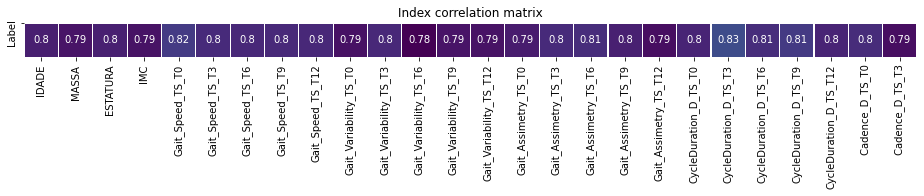

<Figure size 432x288 with 0 Axes>

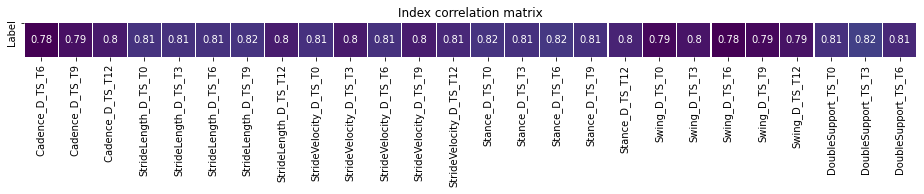

<Figure size 432x288 with 0 Axes>

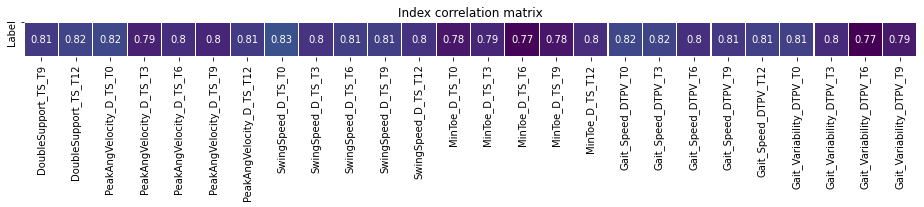

<Figure size 432x288 with 0 Axes>

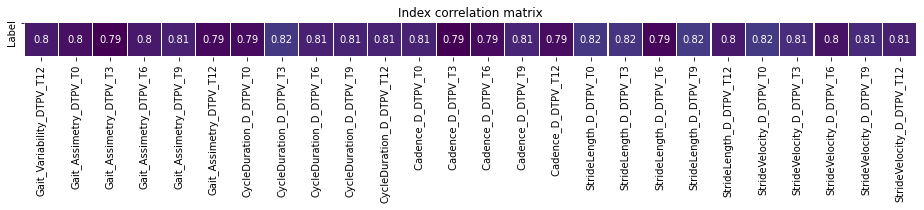

<Figure size 432x288 with 0 Axes>

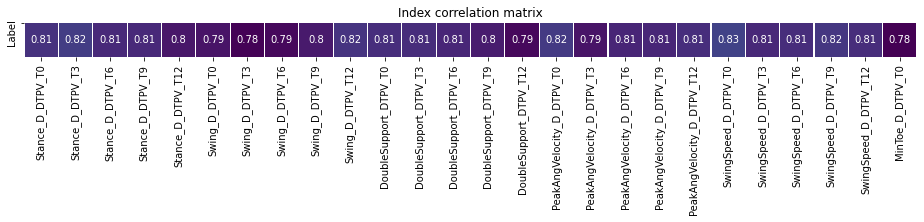

<Figure size 432x288 with 0 Axes>

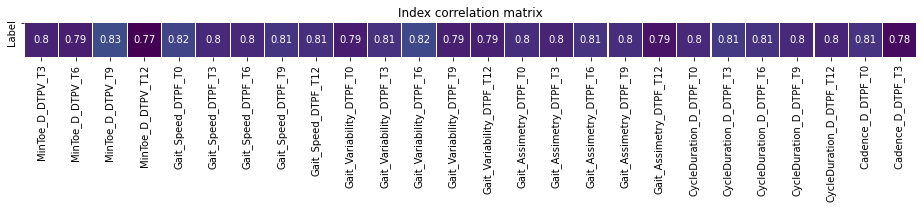

<Figure size 432x288 with 0 Axes>

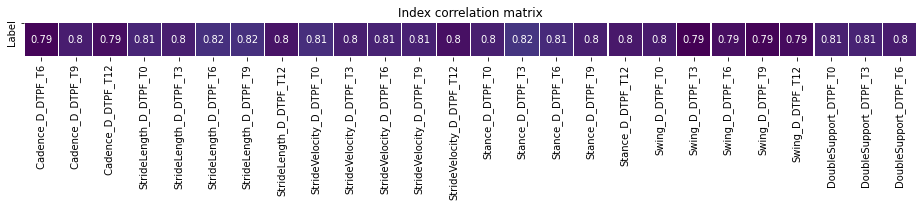

<Figure size 432x288 with 0 Axes>

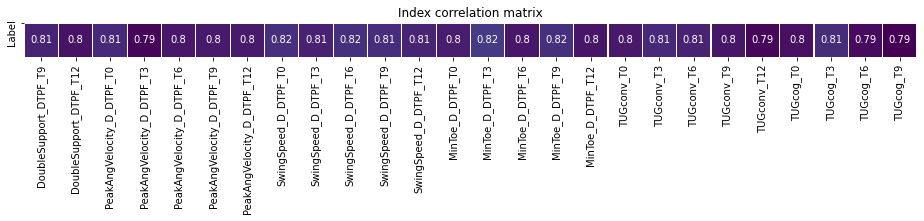

<Figure size 432x288 with 0 Axes>

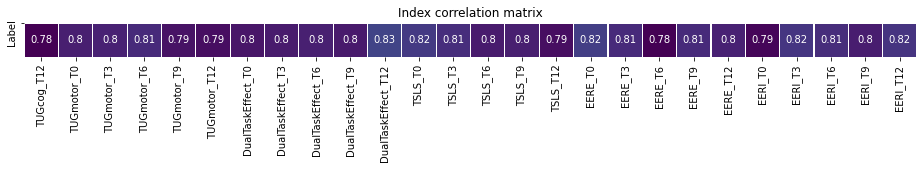

<Figure size 432x288 with 0 Axes>

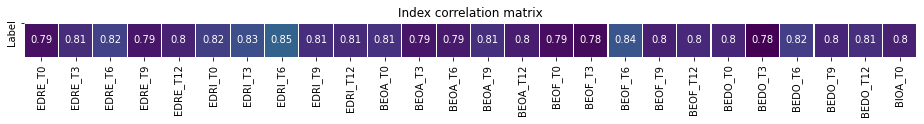

<Figure size 432x288 with 0 Axes>

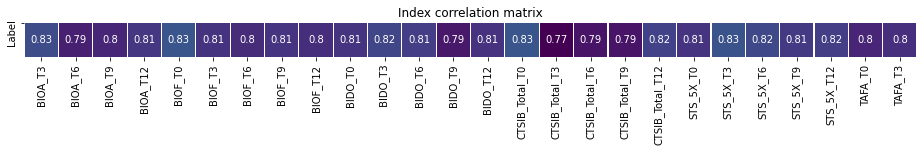

<Figure size 432x288 with 0 Axes>

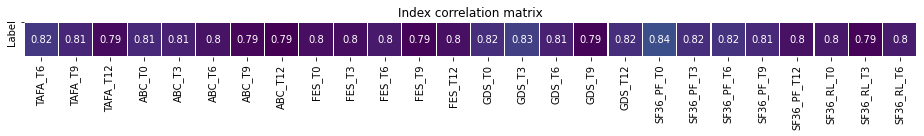

<Figure size 432x288 with 0 Axes>

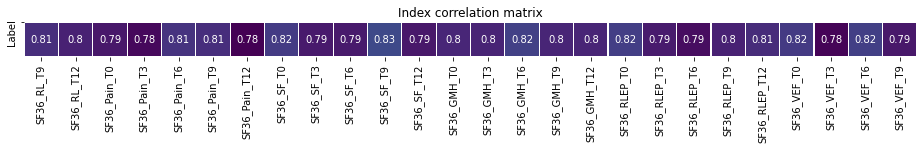

<Figure size 432x288 with 0 Axes>

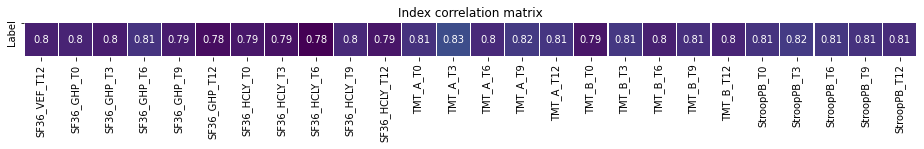

<Figure size 432x288 with 0 Axes>

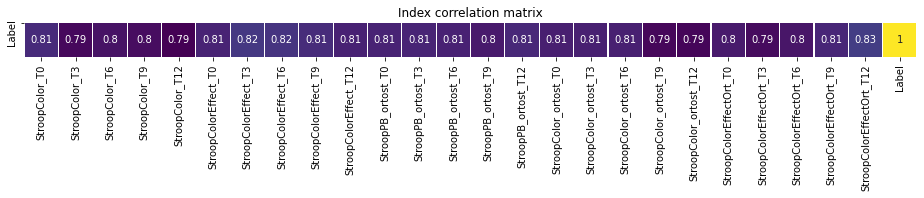

In [83]:
model = GreyRelationalCoefficient(small_df, standard=True)
cors = model.get_calculate_relational_coefficient(parent_column=-1)

mean_cors = cors.mean(axis=0)
columns = small_df.columns

j = 0
for i in range(0, len(columns), 26):
    if i == j == 0:
        continue
    plot_average_grey_relational_coefficient(mean_cors[j:i], columns[j:i], label=columns[-1])
    plt.show()
    j = i
    
plot_average_grey_relational_coefficient(mean_cors[j:], columns[j:], label=columns[-1])

In [6]:
print("Max: ", mean_cors[:-1].max())
print("Min: ", mean_cors.min())

Max:  0.8482402434973937
Min:  0.7700031053488331


In [9]:
result_df = pd.DataFrame(mean_cors, index=columns, columns=["GRC"])
sorted_result_df = result_df.sort_values(by="GRC", ascending=False)

In [10]:
sorted_result_df.to_csv("Equidoso_Features_and_Grey_Score.csv")

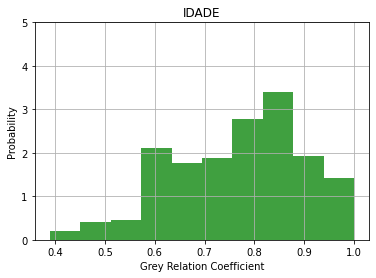

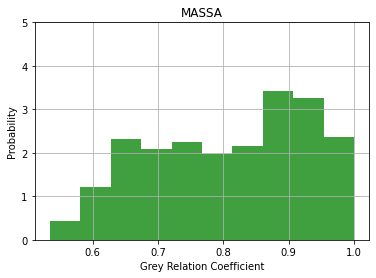

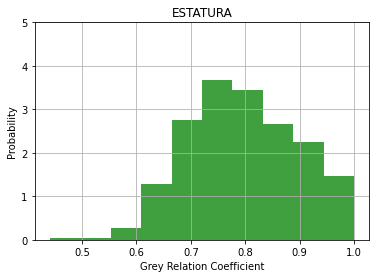

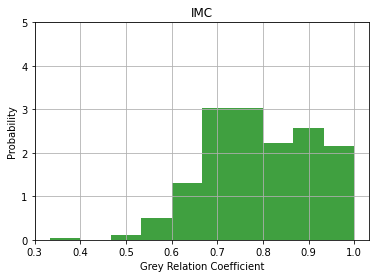

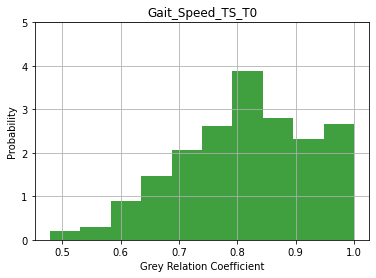

...

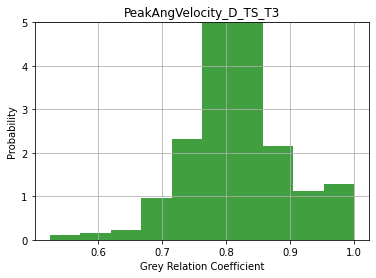

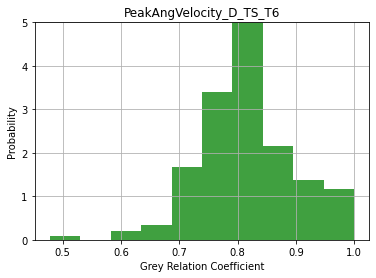

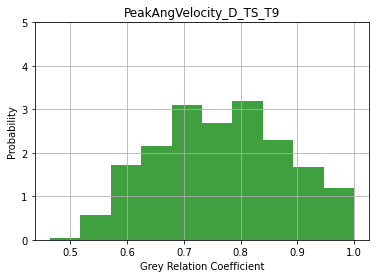

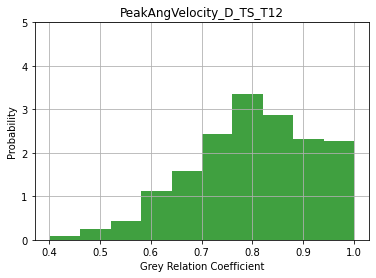

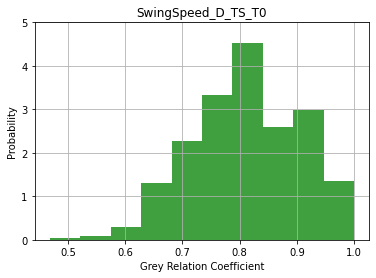

In [98]:
# the histogram of the data
for column, cors_val in zip(columns, cors):
    n, bins, patches = plt.hist(cors_val, density=True, facecolor='g', alpha=0.75)
    plt.xlabel('Grey Relation Coefficient')
    plt.ylabel('Probability')
    plt.title(column)
    plt.ylim(0, 5)
    plt.grid(True)
    plt.show()

In [106]:
cors_val = cors.T
new_df_grc = pd.DataFrame()
for i, column in enumerate(columns):
    new_column_name = column + "_grc"
    new_df_grc[new_column_name] = cors_val[i]

In [105]:
small_df[small_df["StroopColorEffectOrt_T9_grc"] > 0.9]

,IDADE,MASSA,ESTATURA,IMC,Gait_Speed_TS_T0,Gait_Speed_TS_T3,Gait_Speed_TS_T6,Gait_Speed_TS_T9,Gait_Speed_TS_T12,Gait_Variability_TS_T0,...,StroopColor_ortost_T3_grc,StroopColor_ortost_T6_grc,StroopColor_ortost_T9_grc,StroopColor_ortost_T12_grc,StroopColorEffectOrt_T0_grc,StroopColorEffectOrt_T3_grc,StroopColorEffectOrt_T6_grc,StroopColorEffectOrt_T9_grc,StroopColorEffectOrt_T12_grc,Label_grc
ID,,,,,,,,,,,,,,,,,,,,,
s10,75,66.0,1.48,30.13,1.46,1.35,1.45,1.24,1.19,3.07,...,0.947163,0.813017,0.798405,0.620113,0.987877,0.947849,0.819776,0.927900,0.971385,1.0
s12,64,90.5,1.62,34.48,1.36,1.26,1.28,1.09,1.02,2.57,...,0.946975,0.982422,0.910465,0.968480,0.768585,0.802759,0.733248,0.916362,0.812156,1.0
s13,69,68.4,1.60,26.72,1.38,1.27,1.18,1.14,1.31,2.84,...,0.674647,0.704052,0.738257,0.792512,0.895541,0.967023,0.945195,0.934534,0.802786,1.0
s15,80,97.8,1.62,37.27,1.48,1.26,1.47,1.34,1.34,3.18,...,0.887549,0.843007,0.831018,0.860267,0.978615,0.932422,0.911778,0.987762,0.987248,1.0
s16,71,58.8,1.47,27.21,1.73,1.33,1.45,1.20,1.24,3.68,...,0.565269,0.845459,0.721892,0.824348,0.965119,0.643560,0.779805,0.953144,0.815483,1.0
s18,65,63.3,1.50,28.13,1.16,1.03,1.15,0.99,1.05,2.32,...,0.606550,0.743681,0.752219,0.734072,0.798166,0.698361,0.987057,0.917937,0.907508,1.0
s22,62,101.3,1.59,40.07,1.00,1.01,0.94,1.01,0.97,3.45,...,0.942359,0.922366,0.884270,0.973905,0.778572,0.761410,0.826033,0.950441,0.846906,1.0
s28,74,73.2,1.58,29.32,1.35,1.50,1.33,1.32,1.22,1.86,...,0.698625,0.796676,0.687934,0.872527,0.762963,0.995194,0.782674,0.962366,0.767093,1.0
s36,71,74.0,1.46,34.72,1.40,1.36,1.43,1.35,1.34,4.12,...,0.730578,0.850276,0.885154,0.991462,0.956620,0.624077,0.670872,0.941137,0.739001,1.0


# General Grey Incidences

## Absolute Degree of Grey Incidence
- [Grey Information: Theory and Practical Applications (Advanced Information and Knowledge Processing) 2006 edition by Liu, Sifeng, Lin, Yi](https://www.amazon.com/Grey-Information-Practical-Applications-Processing/dp/B011DC896K)

In [5]:
df_T0 = small_df.filter(regex="Gait_Speed_TS")
df_T0.head()

,Gait_Speed_TS_T0,Gait_Speed_TS_T3,Gait_Speed_TS_T6,Gait_Speed_TS_T9,Gait_Speed_TS_T12
ID,,,,,
s01,1.11,1.08,1.10,1.15,1.41
s02,1.41,1.34,1.43,1.40,1.31
s03,1.40,1.43,1.38,1.50,1.44
s04,1.34,1.24,1.37,1.36,1.46
s05,1.61,1.26,1.26,1.41,1.27


In [6]:
import numpy as np

def computing_initial_images_with_zero_initial_points(x0, x1):
    first = x0[0]
    zero_x0 = np.array([i - first for i in x0])
    first = x1[0]
    zero_x1 = np.array([i - first for i in x1])
    return zero_x0, zero_x1

def absolute_degree_of_grey(x0, x1):
    x0, x1 = computing_initial_images_with_zero_initial_points(x0, x1)
    
    # Integrate along the given axis using the composite trapezoidal rule.
    s0 = np.trapz(x0)
    s1 = np.trapz(x1)
    s0_s1 = np.trapz(np.array(x0 - x1))
    absolute_degreed = (1 + abs(s0) + abs(s1)) / (1 + abs(s0) + abs(s1) + abs(s0_s1))
    return absolute_degreed

In [8]:
# Liu and Lin, 2006, pp. 104 – 108

def alternative_absolute_degree_of_grey(x0, x1):
    x0, x1 = computing_initial_images_with_zero_initial_points(x0, x1)
    
    s0 = sum(x0[:-1]) + 1/2 * x0[-1]
    s1 = sum(x1[:-1]) + 1/2 * x1[-1]
    s0_s1 = sum([i - j for i, j in zip(x0[:-1], x1[:-1])]) + 1/2 * (x0[-1] - x1[-1])
    absolute_degreed = (1 + abs(s0) + abs(s1)) / (1 + abs(s0) + abs(s1) + abs(s0_s1))
    return absolute_degreed

In [27]:
# Check if the matrix is symmetric
alternative_absolute_degree_matrix = np.array(
    [[alternative_absolute_degree_of_grey(val_1, val_2) for val_2 in df_T0.values] for val_1 in df_T0.values]
)

absolute_degree_matrix = np.array(
    [[absolute_degree_of_grey(val_1, val_2) for val_2 in df_T0.values] for val_1 in df_T0.values]
)

# np.allclose(absolute_degree_matrix, absolute_degree_matrix.T)

# Results are equal the difference is the decimal places 
# np.array_equal(absolute_degree_matrix, alternative_absolute_degree_matrix)

## Relative Degree of Grey Incidence
- This relative degree of incidence is a quantitative representation of the rates of change of the sequences **Xi** and **Xj** relative to their initial values. The closer the rates of change of **Xi** and **Xj** are the greater **rij** is; and vice versa
- Let X i be a sequence with a non-zero initial value. If `Xj = cXi`, c > 0 is a constant, then `rij = 1`
- `0 < rij ≤ 1`
- For to different sequences their relative degree rij and absolute degree of incidence do not have to have any connections.

In [33]:
def relative_initial_images(x0, x1):
    first = x0[0]
    zero_x0 = np.array([i / first for i in x0])
    first = x1[0]
    zero_x1 = np.array([i / first for i in x1])
    return zero_x0, zero_x1

def relative_degree_of_grey(x0, x1):
    x0, x1 = relative_initial_images(x0, x1)
    relative_degree = absolute_degree_of_grey(x0, x1)
    return relative_degree

In [36]:
matrix = [
    [
        relative_degree_of_grey(df_T0[column_1].values, df_T0[column_2].values)
        for column_2 in df_T0.columns
    ]
    for column_1 in df_T0.columns
]

pd.DataFrame(matrix, df_T0.columns, df_T0.columns)

,Gait_Speed_TS_T0,Gait_Speed_TS_T3,Gait_Speed_TS_T6,Gait_Speed_TS_T9,Gait_Speed_TS_T12
Gait_Speed_TS_T0,1.000000,0.990301,0.983154,0.763456,0.514230
Gait_Speed_TS_T3,0.990301,1.000000,0.992712,0.768668,0.514435
Gait_Speed_TS_T6,0.983154,0.992712,1.000000,0.772642,0.514590
Gait_Speed_TS_T9,0.763456,0.768668,0.772642,1.000000,0.521764
Gait_Speed_TS_T12,0.514230,0.514435,0.514590,0.521764,1.000000


## Synthetic Degree of Grey Incidence
- Reflects the degree of similarity between the zigzagged lines of X i and X j as well as the closeness between the rates of changes of X i and X j with respect to their individual initial values.
- It is an index that describes relatively completely the closeness relationship between sequences.
- If the interest of study is more about the relationship between the relevant absolute quantities, θ can take a greater value. On the other hand, if the focus is more on comparison between rates of changes, then θ can take a smaller value.
- `ρij = θεij + (1 − θ ) rij`

In [38]:
def synthetic_degree_of_grey(x0, x1, theta=0.5):
    eij = absolute_degree_of_grey(x0, x1)
    rij = relative_degree_of_grey(x0, x1)
    return theta * eij + ((1 - theta) * rij)

In [39]:
matrix = [
    [
        synthetic_degree_of_grey(df_T0[column_1].values, df_T0[column_2].values)
        for column_2 in df_T0.columns
    ]
    for column_1 in df_T0.columns
]

pd.DataFrame(matrix, df_T0.columns, df_T0.columns)

,Gait_Speed_TS_T0,Gait_Speed_TS_T3,Gait_Speed_TS_T6,Gait_Speed_TS_T9,Gait_Speed_TS_T12
Gait_Speed_TS_T0,1.000000,0.983895,0.981025,0.767412,0.513107
Gait_Speed_TS_T3,0.983895,1.000000,0.995621,0.776415,0.513399
Gait_Speed_TS_T6,0.981025,0.995621,1.000000,0.777985,0.513465
Gait_Speed_TS_T9,0.767412,0.776415,0.777985,1.000000,0.519587
Gait_Speed_TS_T12,0.513107,0.513399,0.513465,0.519587,1.000000


# Experiment
- Estimating indicators as: Leading, Syncronic and Stagnant

## Criteria
- The process to define the indicators has the following standards:

#### Leading:
1. The indicated appearence of gait deterioration must be at least 2 data collections (T0, T3, ...) ahead of the actual occurence. **Such leading relationship needs to be relatively stable with few exceptions**
2. The indicated gait samples and the historical gait cycles are nearly one-to-one corresponded to each other. For the most recent samples at least 1 time the indicated samples are ahead of the actual occurences with at least 2 data collections of lead time
3. The features provide relatively definite and clear leading relationships with respect to the gait signals


#### Synchronic 
- The time differences between the indicated appearances and the actual occurences of gait deterioration need to be within plus and minus 2 data collections

#### Stagnant 
- The indicated appearances are behind the actual occurences by at least 2 data collections

- **As expected, in practical selections it is almost impossible to actually find an index that meets all the stated standards. So, what can be done is that based on the recorded reference cycles, we look for the statistical indices that meet the previously stated standards as closely as possible.**
- If among the one-to-one correspondences between an index and the actually recorded cycles over 2/3 of times the index is leading the actual occurrences, then we treat such an index as leading. Similar treatments are applied to synchronic indices and stagnant representations.


## Steps
1. Define a basic index for the grey incidence analysis.
1. Calculate the absolute degree of grey incidence between each criterion and the reference.

In [50]:
grey_incidence_reference = small_df["Label"]

In [51]:
df_L_2 = small_df.filter(regex="T0")
df_L_2.columns = columns=[i.replace("_T0", "") for i in df_L_2.columns]

In [52]:
df_L_1 = small_df.filter(regex="T3")
df_L_1.columns = columns=[i.replace("_T3", "") for i in df_L_1.columns]

In [53]:
df_L0 = small_df.filter(regex="T6")
df_L0.columns = columns=[i.replace("_T6", "") for i in df_L0.columns]

In [54]:
df_L1 = small_df.filter(regex="T9")
df_L1.columns = columns=[i.replace("_T9", "") for i in df_L1.columns]

In [55]:
df_L2 = small_df.filter(regex="T12")
df_L2.columns = columns=[i.replace("_T12", "") for i in df_L2.columns]

In [63]:
L_list = [df_L_2, df_L_1, df_L0, df_L1, df_L2]
L_list_columns = ["L = -2", "L = -1", "L = 0", "L = 1", "L = 2"]

In [73]:
matrix = [
    [
        absolute_degree_of_grey(grey_incidence_reference, df_L[column].values)
        for column in df_L.columns
    ] for df_L in L_list
]

grey_incidence = pd.DataFrame(np.array(matrix).T, list(df_L_2.columns), columns=L_list_columns)

,L = -2,L = -1,L = 0,L = 1,L = 2
Gait_Speed_TS,0.505654,0.505737,0.505732,0.506629,0.617131
Gait_Variability_TS,0.769344,0.505137,0.505560,0.581639,0.824672
Gait_Assimetry_TS,0.502669,0.724512,0.686750,0.956475,0.504564
CycleDuration_D_TS,0.539098,0.546639,0.566311,0.565574,0.534016
Cadence_D_TS,0.500849,0.500721,0.500496,0.746524,0.810902
...,...,...,...,...,...
StroopColor,0.581035,0.535732,0.507267,0.501132,0.506415
StroopColorEffect,0.505909,0.505919,0.500087,0.500596,0.500071
StroopPB_ortost,0.595876,0.559374,0.546201,0.501407,0.534270
StroopColor_ortost,0.521893,0.511471,0.508011,0.912385,0.508183


In [105]:
def highlight_max(s):
    is_large = s.nlargest(2).values
    return ['background-color: yellow' if v in is_large else '' for v in s]

grey_incidence.style.apply(highlight_max)

,L = -2,L = -1,L = 0,L = 1,L = 2
Gait_Speed_TS,0.505654,0.505737,0.505732,0.506629,0.617131
Gait_Variability_TS,0.769344,0.505137,0.505560,0.581639,0.824672
Gait_Assimetry_TS,0.502669,0.724512,0.686750,0.956475,0.504564
CycleDuration_D_TS,0.539098,0.546639,0.566311,0.565574,0.534016
Cadence_D_TS,0.500849,0.500721,0.500496,0.746524,0.810902
StrideLength_D_TS,0.506013,0.506234,0.506450,0.521885,0.520820
StrideVelocity_D_TS,0.505622,0.505711,0.505794,0.506886,0.507263
Stance_D_TS,0.587081,0.584935,0.580968,0.506367,0.504518
Swing_D_TS,0.501219,0.501184,0.501122,0.803279,0.504469
DoubleSupport_TS,0.545003,0.549434,0.541421,0.725574,0.507181


# General Analysis Recommendation
- Synchronic indices should be selected from those with larger absolute degrees of grey incidence, because the large degrees of incidence indicate that these criteria have greater similarities in comparison with that of reference index
- One must consider wheter or not the related absoulte degrees of grey incidence will be even greater when L ≠ 0 . If when L = 0 the value of the absolute degree of grey incidence of a certain index is ranked quite in the front, and when L = − 4, its value is even greater, it means that after this index is translated to four months earlier, it is more similar to the pattern of the increase in industry output. So, in this case, this specific index can be seen as one leading the economic cycle by as much as about four months
- By using these two standards, we can not only classify indices as synchronic, leading, or stagnant, but also the specific amount of leading or staggering amount of time.

# Gait Analysis
- Need to analyse the results for the individual classes 

In [108]:
def highlight_only_max(s):
    is_large = s.nlargest(1).values
    return ['background-color: yellow' if v in is_large else '' for v in s]

grey_incidence.T.style.apply(highlight_only_max)

,Gait_Speed_TS,Gait_Variability_TS,Gait_Assimetry_TS,CycleDuration_D_TS,Cadence_D_TS,StrideLength_D_TS,StrideVelocity_D_TS,Stance_D_TS,Swing_D_TS,DoubleSupport_TS,PeakAngVelocity_D_TS,SwingSpeed_D_TS,MinToe_D_TS,Gait_Speed_DTPV,Gait_Variability_DTPV,Gait_Assimetry_DTPV,CycleDuration_D_DTPV,Cadence_D_DTPV,StrideLength_D_DTPV,StrideVelocity_D_DTPV,Stance_D_DTPV,Swing_D_DTPV,DoubleSupport_DTPV,PeakAngVelocity_D_DTPV,SwingSpeed_D_DTPV,MinToe_D_DTPV,Gait_Speed_DTPF,Gait_Variability_DTPF,Gait_Assimetry_DTPF,CycleDuration_D_DTPF,Cadence_D_DTPF,StrideLength_D_DTPF,StrideVelocity_D_DTPF,Stance_D_DTPF,Swing_D_DTPF,DoubleSupport_DTPF,PeakAngVelocity_D_DTPF,SwingSpeed_D_DTPF,MinToe_D_DTPF,TUGconv,TUGcog,TUGmotor,DualTaskEffect,TSLS,EERE,EERI,EDRE,EDRI,BEOA,BEOF,BEDO,BIOA,BIOF,BIDO,CTSIB_Total,STS_5X,TAFA,ABC,FES,GDS,SF36_PF,SF36_RL,SF36_Pain,SF36_SF,SF36_GMH,SF36_RLEP,SF36_VEF,SF36_GHP,SF36_HCLY,TMT_A,TMT_B,StroopPB,StroopColor,StroopColorEffect,StroopPB_ortost,StroopColor_ortost,StroopColorEffectOrt
L = -2,0.505654,0.769344,0.502669,0.539098,0.500849,0.506013,0.505622,0.587081,0.501219,0.545003,0.500187,0.503505,0.508013,0.505652,0.503644,0.505855,0.546885,0.500768,0.506087,0.505668,0.601067,0.501382,0.549908,0.500158,0.503551,0.508012,0.505235,0.667656,0.501353,0.581066,0.500438,0.505779,0.505203,0.571109,0.501023,0.541073,0.500095,0.503121,0.508012,0.673710,0.538110,0.642390,0.504383,0.637635,0.762931,0.909836,0.506250,0.503623,0.740328,0.614426,0.526393,0.542787,0.762623,0.686721,0.740157,0.502305,0.503546,0.500114,0.527256,0.587393,0.500183,0.508589,0.500431,0.519987,0.500237,0.512701,0.500182,0.500155,0.500165,0.500515,0.500063,0.530608,0.581035,0.505909,0.595876,0.521893,0.630000
L = -1,0.505737,0.505137,0.724512,0.546639,0.500721,0.506234,0.505711,0.584935,0.501184,0.549434,0.500116,0.503370,0.508010,0.505675,0.503136,0.670410,0.574426,0.500636,0.506143,0.505651,0.580622,0.501127,0.542513,0.500096,0.503334,0.508006,0.505439,0.503722,0.623078,0.586230,0.500577,0.505880,0.505412,0.581320,0.501165,0.544966,0.500094,0.503218,0.508008,0.620568,0.606316,0.632909,0.516885,0.633205,0.845492,0.678934,0.814142,0.503037,0.900000,0.730574,0.789262,0.507487,0.503846,0.990039,0.571262,0.502388,0.500592,0.881155,0.521441,0.616720,0.500099,0.500047,0.500063,0.500044,0.500050,0.500045,0.500061,0.500359,0.500070,0.500146,0.505976,0.529495,0.535732,0.505919,0.559374,0.511471,0.500152
L = 0,0.505732,0.505560,0.686750,0.566311,0.500496,0.506450,0.505794,0.580968,0.501122,0.541421,0.500120,0.503509,0.508104,0.505695,0.506799,0.759354,0.573525,0.500463,0.506427,0.505827,0.584909,0.501205,0.544102,0.500091,0.503460,0.509590,0.505429,0.703115,0.791803,0.590738,0.500393,0.506230,0.505491,0.586122,0.501188,0.542003,0.500074,0.503216,0.508106,0.815408,0.570736,0.506960,0.505456,0.707511,0.501959,0.503049,0.504596,0.506589,0.506118,0.972951,0.504177,0.602131,0.506433,0.505397,0.634361,0.661639,0.748525,0.500072,0.548266,0.504593,0.500088,0.514446,0.500556,0.500337,0.500216,0.500050,0.537584,0.500108,0.500112,0.500540,0.500139,0.535898,0.507267,0.500087,0.546201,0.508011,0.500075
L = 1,0.506629,0.581639,0.956475,0.565574,0.746524,0.521885,0.506886,0.506367,0.803279,0.725574,0.504145,0.749016,0.509836,0.507298,0.747295,0.503731,0.529508,0.501888,0.700902,0.506824,0.807459,0.505774,0.508159,0.561904,0.593607,0.512295,0.563115,0.614672,0.762343,0.507785,0.943443,0.551066,0.508187,0.822459,0.504896,0.757427,0.502530,0.601475,0.512295,0.503582,0.915871,0.505800,0.611967,0.515902,0.502976,0.502427,0.505882,0.504065,0.535000,0.527377,0.561230,0.506027,0.507695,0.507722,0.500543,0.505299,0.682295,0.681634,0.796393,0.506249,0.504874,0.972575,0.605734,0.832135,0.908197,0.506020,0.959262,0.615487,0.501419,0.506018,0.607801,0.504088,0.501132,0.500596,0.501407,0.912385,0.723886
L = 2,0.617131,0.824672,0.504564,0.534016,0.810902,0.520820,0.507263,0.504518,0.504469,0.507181,0.618052,0.505885,0.508100,0.507639,0.962191,0.502516,0.545820,0.669672,0.507869,0.569180,0.504297,0.8